### Practica 05 | PDI 
## Vargas Bravo Paola

In [1]:
import  PIL
from PIL import Image,ImageFilter
from skimage import io
import numpy as np
import matplotlib.pyplot as plt
import random
import os
import math
from skimage.util import random_noise
import cv2
from scipy.fftpack import fft2, ifft2, fftshift, ifftshift

In [2]:
def show_image(image) :
  arr = np.asarray(image)
  plt.imshow(arr, cmap='gray', vmin=0, vmax=255)
  plt.show()

### Funciones Auxiliares

In [10]:
def ruido_sal_pimienta(imagen, pa, pb):
    imagen_np = np.array(imagen)
    ruido = np.random.rand(*imagen_np.shape)
    mascara_sal = ruido < pa / 2
    mascara_pimienta = ruido > 1 - pb / 2
    imagen_con_ruido = np.copy(imagen_np)
    imagen_con_ruido[mascara_sal] = 0  # Sal: establece píxeles a negro
    imagen_con_ruido[mascara_pimienta] = 255  # Pimienta: establece píxeles a blanco
    imagen_con_ruido_pil = Image.fromarray(imagen_con_ruido)
    return imagen_con_ruido_pil

In [11]:
def ruido_Gaussiano_N(img, media, desviacion_estandar):
    img_array = np.array(img, dtype=np.uint8)
    ruido = np.random.normal(media, desviacion_estandar, img_array.shape)
    imagen_ruido = img_array + ruido
    imagen_ruido = np.clip(imagen_ruido, 0, 255)
    imagen_ruido_pil = Image.fromarray(imagen_ruido.astype(np.uint8), 'L')
    return imagen_ruido_pil

In [12]:
img1  = Image.open('lena.tiff')
img2  = Image.open('circuit2.png')
img2 = img2.convert('L')

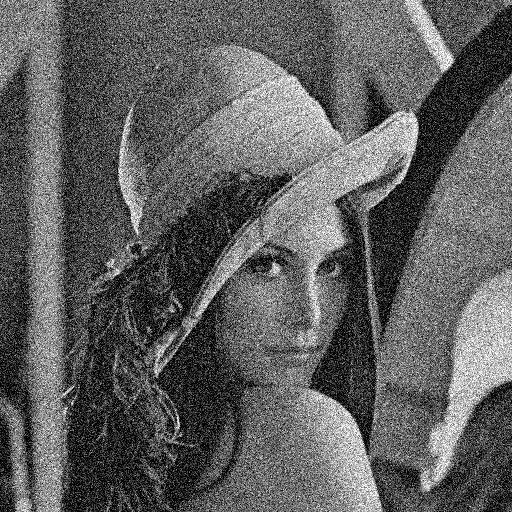

In [13]:
img1_G = ruido_Gaussiano_N(img1,0,40)
ruido_Gaussiano_N(img1,0,40)

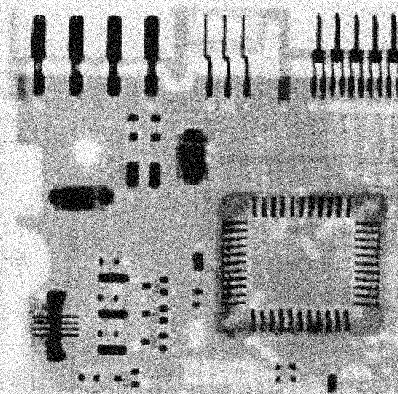

In [14]:
img2_G = ruido_Gaussiano_N(img2, 0, 40)
ruido_Gaussiano_N(img2,0,40)

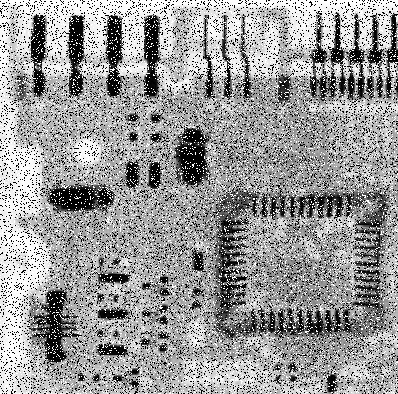

In [15]:
img2_SP = ruido_sal_pimienta(img2,0.25,0.25)
ruido_sal_pimienta(img2,0.25,0.25)

## Filtro Aritmético

In [16]:
def convolucion_aritmetica(n,vecinos,image) :
    suma = 0
    for v in vecinos :
        suma = suma + v
    suma = suma // n
    return suma

In [17]:
def filtro_aritmetico(orden,image) :
 ordenes_Disponibles = [3,5,7,11]
 try :    
  if isinstance(image, Image.Image):
    if image.mode == "L"  and (orden in ordenes_Disponibles):
        n = orden * orden
        ancho, alto = image.size
        resta = resta_orden(orden)
        anchoN = ancho-resta
        altoN = alto-resta
        imageN = Image.new("L", (anchoN, altoN))
        for x in range(anchoN) :
         for y in range (altoN) :
            x_Aux = x
            y_Aux = y
            suma = suma_orden(orden)
            original_x = x_Aux + suma
            original_y = y_Aux + suma
            vecinos = vecinos_nxn_2(original_x,original_y,orden,image)
            suma = convolucion_aritmetica(n,vecinos,image)
            imageN.putpixel((x, y), suma)
        return imageN
    else :
        print("Se solicita una imagen en escala de grises")  
        print("Se solicita un orden válido entre [3,5,7,11]")
        print("Se solicita un imagen de objeto PIL")
  else :
        raise ValueError("Se solicita un imagen de objeto tipo PIL") 
 except ValueError as e:
          print(f"Error: {e}")

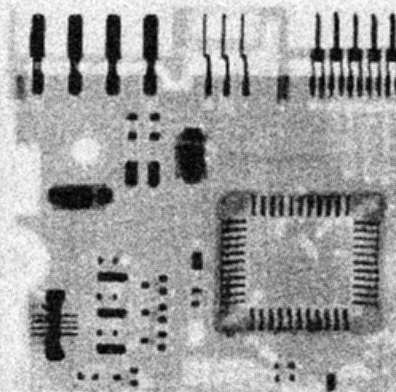

In [20]:
img_Ari = filtro_aritmetico(3,img2_G)
filtro_aritmetico(3,img2_G)

## Filtro Geométrico

In [3]:
def convolucion_geometrica(n,vecinos,image) :
    suma = 1
    for v in vecinos :
        if v != 0 :
         suma = suma * v
    e = 1 / n
    suma = suma **e
    return suma

In [4]:
def filtro_geometrico (orden,image) :
 ordenes_Disponibles = [3,5,7]
 try :    
  if isinstance(image, Image.Image):
    if image.mode == "L"  and (orden in ordenes_Disponibles):
        n = orden * orden
        ancho, alto = image.size
        resta = resta_orden(orden)
        anchoN = ancho-resta
        altoN = alto-resta
        imageN = Image.new("L", (anchoN, altoN))
        for x in range(anchoN) :
         for y in range (altoN) :
            x_Aux = x
            y_Aux = y
            suma = suma_orden(orden)
            original_x = x_Aux + suma
            original_y = y_Aux + suma
            vecinos = vecinos_nxn_2(original_x,original_y,orden,image)
            suma = convolucion_geometrica(n,vecinos,image)
            imageN.putpixel((x, y), round(suma))
        return imageN
    else :
        print("Se solicita una imagen en escala de grises")  
        print("Se solicita un orden válido entre [3,5,7,11]")
        print("Se solicita un imagen de objeto PIL")
  else :
        raise ValueError("Se solicita un imagen de objeto tipo PIL") 
 except ValueError as e:
          print(f"Error: {e}")

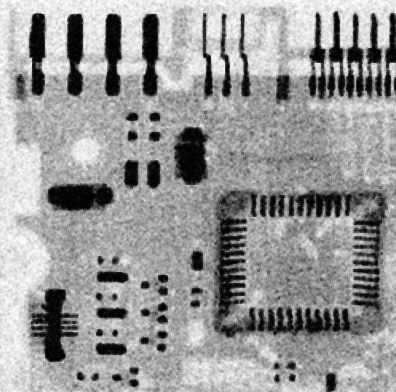

In [18]:
img_Geo = filtro_geometrico(3,img2_G)
filtro_geometrico(3,img2_G)

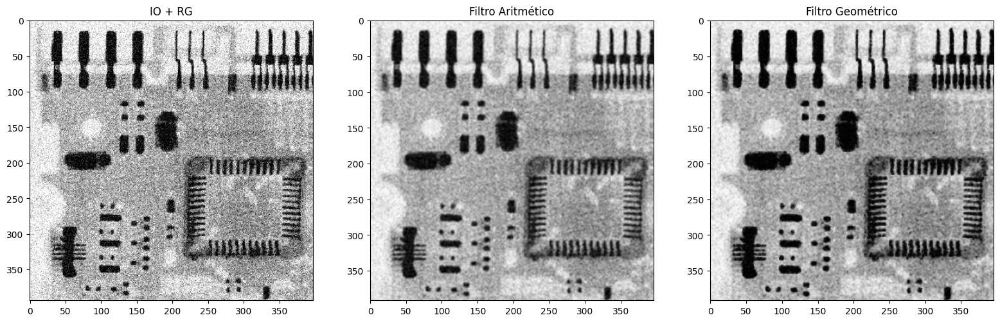

In [21]:
    plt.figure(figsize=(30, 30))

    plt.subplot(1,3,1)
    plt.imshow(img2_G, cmap='gray')
    plt.title('IO + RG')

    plt.subplot(1,3,2)
    plt.imshow(img_Ari, cmap='gray')
    plt.title('Filtro Aritmético')

    plt.subplot(1,3,3)
    plt.imshow(img_Geo, cmap='gray')
    plt.title('Filtro Geométrico')

    plt.subplots_adjust(left=0.1, right=0.6, bottom=0.1, top=0.5, wspace=0.2, hspace=0.4)

## FIltro Adaptativo

In [22]:
def media_local(vecinos):
    mediaL = sum(vecinos) // len(vecinos) 
    return mediaL

In [23]:
def varianza_local(vecinos,mediaL):
    varianzaL = sum((pixel - mediaL) ** 2 for pixel in vecinos) // len(vecinos) 
    return varianzaL

In [24]:
def EA(pixel, varianzaL, mediaL, varianzaN):
    if varianzaL != 0:
        frac = (varianzaN/varianzaL)
        resta = (pixel - mediaL)
        EA = pixel - (frac * resta)
    else:
        EA = 0 
    return EA

In [25]:
def varianza_general(image,orden):
    ancho, alto = image.size
    resta = resta_orden(orden)
    anchoN = ancho-resta
    altoN = alto-resta
    valores_pixeles = [image.getpixel((x, y)) for x in range(anchoN) for y in range(altoN)]
    media = sum(valores_pixeles) / len(valores_pixeles) if valores_pixeles else 0
    varianza_general = sum((pixel - media) ** 2 for pixel in valores_pixeles) / len(valores_pixeles) if valores_pixeles else 0
    return varianza_general

In [26]:
def filtro_adap (image,orden,varianzaN) :
 ordenes_Disponibles = [3,5,7] 
 try :    
  if isinstance(image, Image.Image):
    if image.mode == "L"  and (orden in ordenes_Disponibles) and varianzaN >= 0:
        varianzaN = varianzaN * 0.5#varianza_general(image,orden)**0.5
        n = orden * orden
        ancho, alto = image.size
        resta = resta_orden(orden)
        anchoN = ancho-resta
        altoN = alto-resta
        imageN = Image.new("L", (anchoN, altoN))
        for x in range(anchoN) :
         for y in range (altoN) :
            x_Aux = x
            y_Aux = y
            suma = suma_orden(orden)
            original_x = x_Aux + suma
            original_y = y_Aux + suma
            vecinos = vecinos_nxn_2(original_x,original_y,orden,image)
            mediaL =  media_local(vecinos)
            varianzaL = varianza_local(vecinos,mediaL)
            pixel = image.getpixel((original_x,original_y))
            nuevo_pixel = EA(pixel, varianzaL, mediaL,varianzaN)
            #suma = convolucion_geometrica(n,vecinos,image)
            imageN.putpixel((x, y), int(nuevo_pixel))
        return imageN
    else :
        print("Se solicita una imagen en escala de grises")  
        print("Se solicita un orden válido entre [3,5,7]")
        print("Se solicita un imagen de objeto PIL")
        print("Con una varianza positiva >= 0")
  else :
        raise ValueError("Se solicita un imagen de objeto tipo PIL") 
 except ValueError as e:
          print(f"Error: {e}")

In [27]:
img_Ari_2 = filtro_aritmetico(7,img2_G)

In [28]:
img_Geo_2 = filtro_geometrico(7,img2_G)

In [29]:
img_Adap_2 = filtro_adap (img2_G,7,2500)

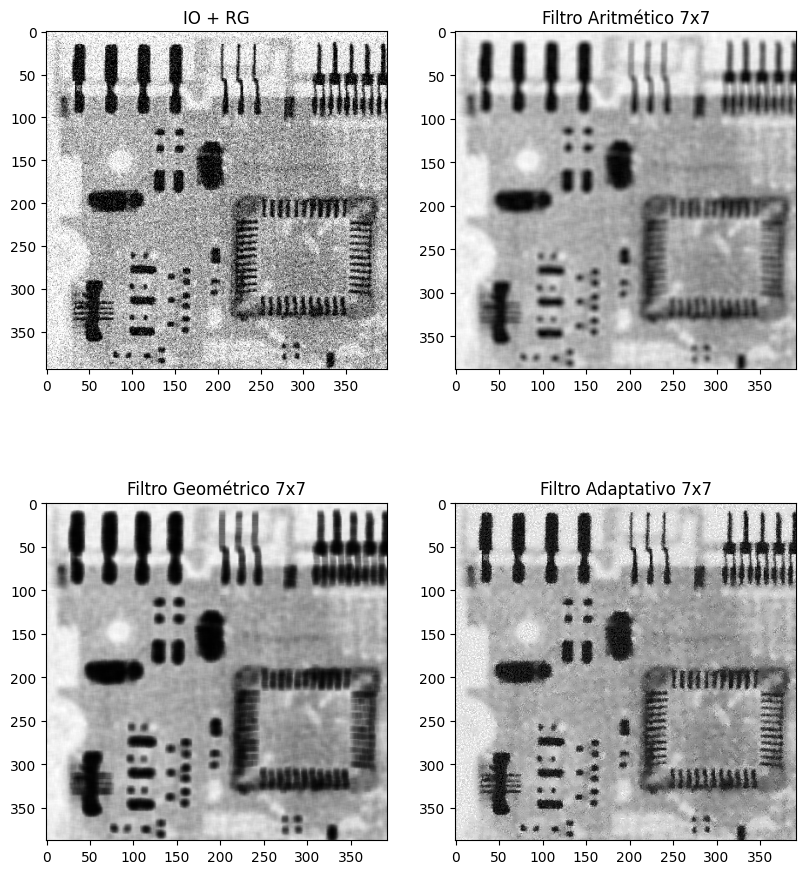

In [42]:
    plt.figure(figsize=(15, 15))

    plt.subplot(2,2,1)
    plt.imshow(img2_G, cmap='gray')
    plt.title('IO + RG' )

    plt.subplot(2,2,2)
    plt.imshow(img_Ari_2, cmap='gray')
    plt.title('Filtro Aritmético 7x7' )

    plt.subplot(2,2,3)
    plt.imshow(img_Geo_2, cmap='gray')
    plt.title('Filtro Geométrico 7x7')

    plt.subplot(2,2,4)
    plt.imshow(img_Adap_2, cmap='gray')
    plt.title('Filtro Adaptativo 7x7')

    plt.subplots_adjust(left=0.1, right=0.6, bottom=0.1, top=0.7, wspace=0.2, hspace=0.1)

## Filtro Mediana Adaptativo

In [9]:
def generar_vecindad(x, y, orden, image):
    pixeles_adj = []
    for i in range(x - (orden // 2), x + (orden // 2) + 1):
        for j in range(y - (orden // 2), y + (orden // 2) + 1):
            pixel = image.getpixel((i, j))
            pixeles_adj.append(pixel)
    pixel_centro = image.getpixel((x, y))
    return pixeles_adj, pixel_centro

In [8]:
def vecinos_nxn_2(x,y,orden,image) :
    vecinos = []
    if orden == 3 :
        vecinos,x = generar_vecindad(x,y,3,image)
    if orden == 5 :
        vecinos,x = generar_vecindad(x,y,5,image)
    if orden == 7 :
        vecinos,x = generar_vecindad(x,y,7,image)
    if orden == 9 :
        vecinos,x = generar_vecindad(x,y,9,image)

    return vecinos

In [5]:
def vecinos_nxn(x,y,orden,image) :
    vecinos = []
    z_xy = 0
    if orden == 3 :
        vecinos, z_xy = generar_vecindad(x,y,3,image) 
    if orden == 5 :
        vecinos, z_xy = generar_vecindad(x,y,5,image)
    if orden == 7 :
        vecinos, z_xy = generar_vecindad(x,y,7,image)

    return vecinos , z_xy

In [6]:
def resta_orden(orden) :
    resta = 0
    if orden == 3 :
        resta = 2
    if orden == 5 :
        resta = 4
    if orden == 7 :
        resta = 6
    if orden == 9 :
        resta = 8
    if orden == 11 :
        resta = 10
    return resta

In [7]:
def suma_orden(orden) :
    suma = 0
    if orden == 3 :
        suma = 1
    if orden == 5 :
        suma = 2
    if orden == 7 :
       suma = 3
    if orden == 9 :
       suma = 4
    if orden == 11 :
       suma = 5
    return suma

In [24]:
def mediana_pixeles (pixeles): 
        lista_ordenada = sorted(pixeles)
        n = len(lista_ordenada)
        if n % 2 == 0:
            medio_izquierdo = lista_ordenada[n // 2 - 1]
            medio_derecho = lista_ordenada[n // 2]
            mediana = (medio_izquierdo + medio_derecho) / 2
        else:
            mediana = lista_ordenada[n // 2]
        return mediana

In [25]:
def convolucion_mediana(vecindades,image) :
    pixeles = []
    for v in vecindades :
        v = v * 1
        pixeles.append(v)
    mediana = mediana_pixeles (pixeles)
    return mediana

In [26]:
def nivelA(zMed,zMax,zMin) :
    A1 = zMed - zMin
    A2 = zMed - zMax
    return A1, A2

In [51]:
def nivelB(z_xy,zMax,zMin) :
    B1 = z_xy - zMin
    B2 = z_xy - zMax
    return B1, B2

In [47]:
def filtro_pbp_mediana_adap(image) :
 ordenes_Disponibles = [3,5,7]
 orden = ordenes_Disponibles[0]
 i  = 1
 SMax = 7
 salir = False
 try :    
   if isinstance(image, Image.Image): 
      if image.mode == "L" :
        ancho, alto = image.size
        resta = resta_orden(7)
        anchoN = ancho-resta
        altoN = alto-resta
        imageN = Image.new("L", (anchoN, altoN))
        for x in range(anchoN) :
         for y in range (altoN) :
            x_Aux = x
            y_Aux = y
            suma = suma_orden(7)
            original_x = x_Aux + suma
            original_y = y_Aux + suma
            while salir == False :
              vecinos,z_xy = vecinos_nxn(original_x,original_y,orden,image)
              zMin  = min(vecinos)
              zMax = max(vecinos)
              zMed = mediana_pixeles (vecinos)
              A1,A2 = nivelA(zMed,zMax,zMin)
              if A1 > 0 and A2 < 0 :
                B1,B2 = nivelB(z_xy,zMax,zMin)
                if B1 > 0 and B2 < 0 :
                    nuevoPixel = z_xy
                    salir = True
                else :
                    nuevoPixel = zMed
                    salir = True
              else :
                  if i < 2 :
                   orden = ordenes_Disponibles[i]
                   i = i + 1
                  else :
                    nuevoPixel = z_xy
                    salir = True
            imageN.putpixel((x, y), nuevoPixel)
            salir = False
        return imageN
      else :
            print("Se solicita una imagen en escala de grises")  
            print("Se solicita un orden válido entre [3,5,7,11]")
            print("Se solicita un imagen de objeto tipo PIL")
   else :
        raise ValueError("Se solicita un imagen de objeto tipo PIL") 
 except ValueError as e:
          print(f"Error: {e}")

In [46]:
def filtro_pbp_mediana(orden,image) :
 ordenes_Disponibles = [3,5,7]
 try :    
   if isinstance(image, Image.Image): 
      if image.mode == "L"  and (orden in ordenes_Disponibles):
        ancho, alto = image.size
        resta = resta_orden(orden)
        anchoN = ancho-resta
        altoN = alto-resta
        imageN = Image.new("L", (anchoN, altoN))
        for x in range(anchoN) :
         for y in range (altoN) :
            x_Aux = x
            y_Aux = y
            suma = suma_orden(orden)
            original_x = x_Aux + suma
            original_y = y_Aux + suma
            #vecinos = vecindades(original_x,original_y)
            vecinos = vecinos_nxn_2(original_x,original_y,orden,image)
            mediana = convolucion_mediana(vecinos,image)
            medianaN = int(mediana)
            imageN.putpixel((x, y), medianaN)
        return imageN
      else :
            print("Se solicita una imagen en escala de grises")  
            print("Se solicita un orden válido entre [3,5,7,11]")
            print("Se solicita un imagen de objeto tipo PIL")
   else :
        raise ValueError("Se solicita un imagen de objeto tipo PIL") 
 except ValueError as e:
          print(f"Error: {e}")

In [50]:
img_M = filtro_pbp_mediana(7,img2_SP)

In [52]:
img_M_Adap = filtro_pbp_mediana_adap(img2_SP)

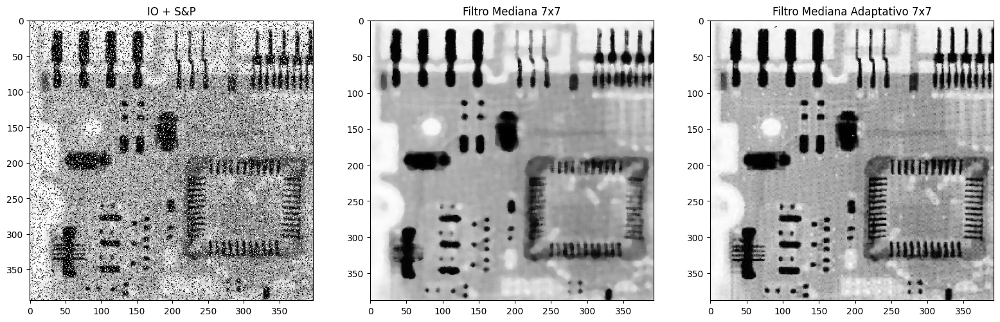

In [53]:
    plt.figure(figsize=(30, 30))

    plt.subplot(1,3,1)
    plt.imshow(img2_SP, cmap='gray')
    plt.title('IO + S&P')

    plt.subplot(1,3,2)
    plt.imshow(img_M, cmap='gray')
    plt.title('Filtro Mediana 7x7')

    plt.subplot(1,3,3)
    plt.imshow(img_M_Adap, cmap='gray')
    plt.title('Filtro Mediana Adaptativo 7x7')

    plt.subplots_adjust(left=0.1, right=0.6, bottom=0.1, top=0.5, wspace=0.2, hspace=0.4)

## Filtro Wiener

## Caso 1

In [33]:
def resta_imagenes(img, img2):
    ancho, alto = img2.size
    img_re = img.resize((ancho, alto))
    imageN = Image.new("L", (ancho, alto))

    for x in range(ancho):
        for y in range(alto):
            valor1 = img_re.getpixel((x, y))
            valor2 = img2.getpixel((x, y))
            
            # Realiza la resta y ajusta al rango [0, 255]
            valorRes = np.clip(valor1 - valor2, 0, 255)
            
            imageN.putpixel((x, y), int(valorRes))

    return imageN

In [71]:
def filtro_Wiener(image, imageG):
    try:
        if isinstance(image, Image.Image) and isinstance(imageG, Image.Image):
            if image.mode == "L" and imageG.mode == "L":  # Check if the image is in grayscale
                ordenes_Disponibles = [3, 5, 7, 11]
                orden = 7  # Replace with the desired value of 'orden'

                if orden in ordenes_Disponibles:
                    if image.size != imageG.size:
                        imageG = imageG.resize(image.size)

                    r = resta_imagenes(imageG, image)

                    iF0 = np.fft.fft2(image)
                    iFRi = np.fft.fft2(imageG)
                    iFR = np.fft.fft2(r)

                    iF0_R = np.abs(iF0)
                    iFRi_R = np.abs(iFRi)
                    iFR_R = np.abs(iFR)

                    W = iF0_R / (iF0_R + iFR_R)
                    G = W * iFRi
                    G = np.fft.ifft2(G)
                    G = np.real(G)
                    G = np.clip(G, 0, 255).astype(np.uint8)
                    return G
                else:
                    print("Se solicita un orden válido entre [3, 5, 7, 11]")
            else:
                print("Se solicita una imagen en escala de grises")
        else:
            raise ValueError("Se solicita una imagen de objeto tipo PIL")
    except ValueError as e:
        print(f"Error: {e}")

In [1]:
def filtro_Wiener_General(image, imageG,caso):
    try:
        if isinstance(image, Image.Image) and isinstance(imageG, Image.Image):
            if image.mode == "L" and imageG.mode == "L":  # Check if the image is in grayscale
                casos_Disponibles = [1, 2, 3, 4]
                if caso in casos_Disponibles:
                    if image.size != imageG.size:
                        imageG = imageG.resize(image.size)

                    r = resta_imagenes(imageG, image)

                    iF0 = np.fft.fft2(image)
                    iFRi = np.fft.fft2(imageG)
                    iFR = np.fft.fft2(r)

                    iF0_R = np.abs(iF0)
                    iFRi_R = np.abs(iFRi)
                    iFR_R = np.abs(iFR)
                    if caso == 1 :
                      W = iF0_R / (iF0_R + iFR_R)
                      G = W * iFRi
                    if caso == 2 :
                         H = iFRi / iF0
                         W = 1 / H
                         G = W * iFRi
                    if caso == 3 :
                        W = iF0_R / (iF0_R + iFR_R)
                        H = iFRi / iF0
                        W2 = 1 / H
                        W3 = W *W2
                        G = W3 * iFRi
                    if caso == 4 :
                        H = iFRi / iF0
                        H2 = np.conjugate(H)
                        #W2 = 1 / H
                        #W3 = 1 /H2
                        W = (iF0_R*H2) / (H*iF0_R*H2 + iFR_R)
                        G = W * iFRi
                    G = np.fft.ifft2(G)
                    G = np.real(G)
                    G = np.clip(G, 0, 255).astype(np.uint8)
                    return G
                else:
                    print("Se solicita un orden válido entre [3, 5, 7, 11]")
            else:
                print("Se solicita una imagen en escala de grises")
        else:
            raise ValueError("Se solicita una imagen de objeto tipo PIL")
    except ValueError as e:
        print(f"Error: {e}")

In [76]:
img_Wiener_1 = filtro_Wiener_General(img1, img1_G,1)

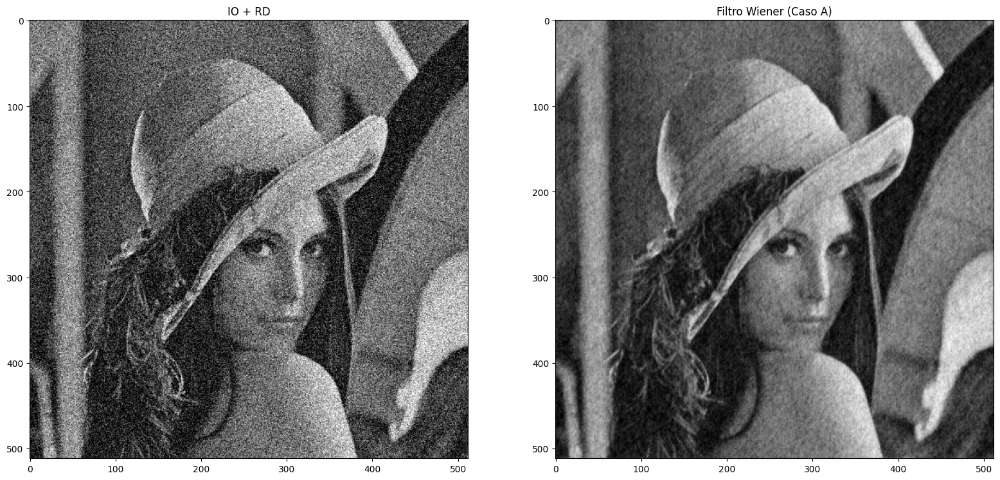

In [77]:
    plt.figure(figsize=(30, 30))

    plt.subplot(1,2,1)
    plt.imshow(img1_G, cmap='gray')
    plt.title('IO + RD')

    plt.subplot(1,2,2)
    plt.imshow(img_Wiener_1, cmap='gray')
    plt.title('Filtro Wiener (Caso A)')

    plt.subplots_adjust(left=0.1, right=0.6, bottom=0.1, top=0.5, wspace=0.2, hspace=0.4)

## Caso 2

In [13]:
def generate_pascal_triangle_row(n):
    pascal_triangle = np.zeros((n, n), dtype=int)
    for line in range(n):
        for i in range(line + 1):
            if i == 0 or i == line:
                pascal_triangle[line][i] = 1
            else:
                pascal_triangle[line][i] = pascal_triangle[line - 1][i - 1] + pascal_triangle[line - 1][i]
    return pascal_triangle[n-1]

In [12]:
def kernel_nxn(n):
    row_triangle = generate_pascal_triangle_row(n).reshape(n,1) # parada
    column_triangle = row_triangle.reshape(1,n) #acostada
    #matrizA = np.tile(column_triangle, (n, 1))
    matrizB = row_triangle * column_triangle
    #matrizB = factor1 * factor2
    return matrizB

In [11]:
def constante_kernel_nxn(n) :
    row_triangle = generate_pascal_triangle_row(n).reshape(n,1) # parada
    k = np.sum(row_triangle)
    constante = k * k
    return constante

In [10]:
def convolucion_promedio_ponderado(image,orden,vecinos,k,kernel) :
    i = 0
    suma = 0
    for x in range(0,orden) :
        for y in range(0,orden) :
            valor = kernel[x][y]
            valor2 = vecinos[i]
            i = i + 1
            pixel_valor = (valor * valor2) // k
            suma = suma + pixel_valor
    #resultado = round(suma/k)
    return round(suma)

In [9]:
def filtro_pbp_ponderado(orden,image):
 ordenes_Disponibles = [3,5,7,9,11]
 try :   
    if isinstance(image, Image.Image):
      if image.mode == "L"  and (orden in ordenes_Disponibles):
        ancho, alto = image.size
        resta = resta_orden(orden)
        anchoN = ancho - resta
        altoN = alto- resta
        kernel = kernel_nxn(orden)
        k = constante_kernel_nxn(orden) 
        imageN = Image.new("L", (anchoN, altoN))
        for x in range(anchoN) :
         for y in range (altoN) :
            x_Aux = x
            y_Aux = y
            suma = suma_orden(orden)
            original_x = x_Aux + suma
            original_y = y_Aux + suma
            #vecinos = vecindades(original_x,original_y)
            #vecinos = vecindad_5x5(original_x,original_y)
            vecinos = vecinos_nxn_2(original_x,original_y,orden,image)
            suma = convolucion_promedio_ponderado(image,orden,vecinos,k,kernel)
            imageN.putpixel((x, y), suma)
        return imageN
      else :
            print("Se solicita una imagen en escala de grises")  
            print("Se solicita un orden válido entre [3,5,7,11]")
            print("Se solicita un imagen de objeto tipo PIL")
    else :
        raise ValueError("Se solicita un imagen de objeto tipo PIL")
 except ValueError as e:
          print(f"Error: {e}")

In [27]:
img1_PN = filtro_pbp_ponderado(9,img1)

In [106]:
def filtro_Wiener_2(image, imageG) :

    if image.size != imageG.size:
        imageG = imageG.resize(image.size)
  
    r = resta_imagenes(imageG,image)
    
    iF0 = np.fft.fft2(image)
    iFRi = np.fft.fft2(imageG)
    iFR = np.fft.fft2(r)
    
    iF0_R = np.abs(iF0)
    iFRi_R = np.abs(iFRi)
    iFR_R = np.abs(iFR)

    H = iFRi / iF0
    W = 1 / H
    
    #W = iF0_R / (iF0_R + iFR_R)
    G = W * iFRi
    G  = np.fft.ifft2(G)
    G = np.real(G) 
    G =  np.clip(G, 0, 255).astype(np.uint8)
    #G = G * corrimiento
    return  G

In [85]:
img_Wiener_2 = filtro_Wiener_General(img1, img1_PN,2)#filtro_Wiener_2(img1, img1_PN)

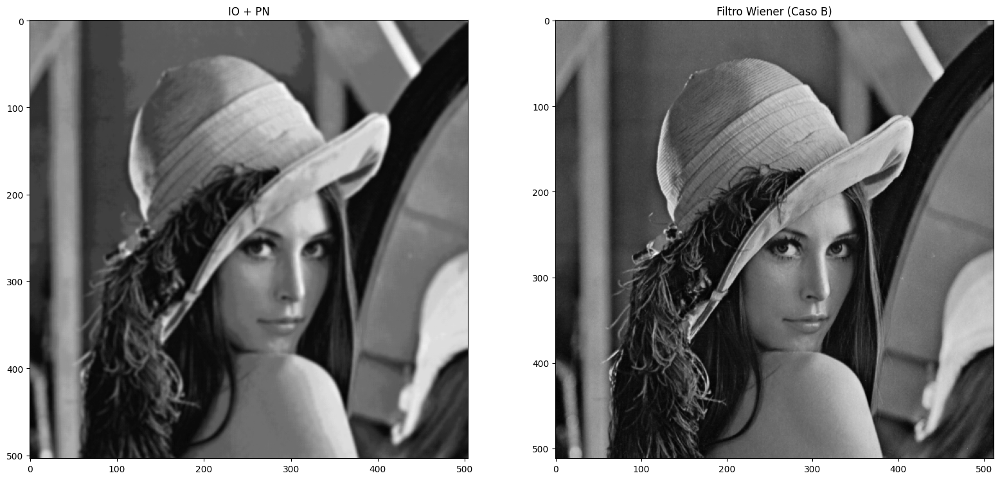

In [86]:
    plt.figure(figsize=(30, 30))

    plt.subplot(1,2,1)
    plt.imshow(img1_PN, cmap='gray')
    plt.title('IO + PN')

    plt.subplot(1,2,2)
    plt.imshow(img_Wiener_2, cmap='gray')
    plt.title('Filtro Wiener (Caso B)')

    plt.subplots_adjust(left=0.1, right=0.6, bottom=0.1, top=0.5, wspace=0.2, hspace=0.4)

## Caso 3

In [110]:
def filtro_Wiener_3(image, imageG) :

    if image.size != imageG.size:
        imageG = imageG.resize(image.size)
  
    r = resta_imagenes(imageG,image)
    
    iF0 = np.fft.fft2(image)
    iFRi = np.fft.fft2(imageG)
    iFR = np.fft.fft2(r)
    
    iF0_R = np.abs(iF0)
    iFRi_R = np.abs(iFRi)
    iFR_R = np.abs(iFR)
    
    W = iF0_R / (iF0_R + iFR_R)
    H = iFRi / iF0
    W2 = 1 / H
    W3 = W *W2
    G = W3 * iFRi
    G  = np.fft.ifft2(G)
    G = np.real(G) 
    G =  np.clip(G, 0, 255).astype(np.uint8)
    #G = G * corrimiento
    return  G

In [87]:
img1_PN_G = filtro_pbp_ponderado(9,img1_G)

In [88]:
img_Wiener_3 = filtro_Wiener_General(img1, img1_PN_G,3)#filtro_Wiener_3(img1, img1_PN_G)

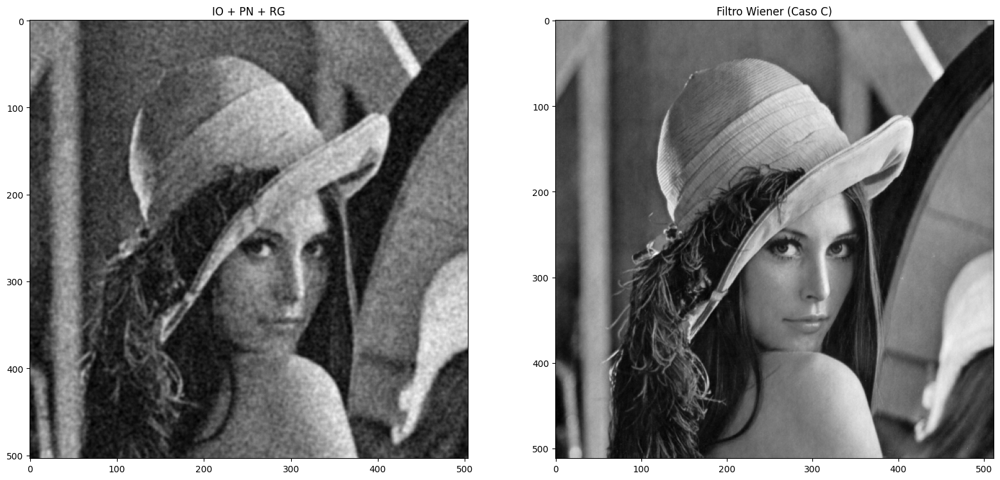

In [89]:
    plt.figure(figsize=(30, 30))

    plt.subplot(1,2,1)
    plt.imshow(img1_PN_G, cmap='gray')
    plt.title('IO + PN + RG')

    plt.subplot(1,2,2)
    plt.imshow(img_Wiener_3, cmap='gray')
    plt.title('Filtro Wiener (Caso C)')

    plt.subplots_adjust(left=0.1, right=0.6, bottom=0.1, top=0.5, wspace=0.2, hspace=0.4)

## Caso 4

In [44]:
def filtro_Wiener_4(image, imageG,imageRG,imagePN) :

    if image.size != imageG.size  :
        imageG = imageG.resize(image.size)
        imageRG = imageRG.resize(image.size)
        imagePN = imagePN.resize(image.size)
  
    r = resta_imagenes(imageRG,imagePN)
    
    iF0 = np.fft.fft2(image)
    iFRi = np.fft.fft2(imageG)
    iFR = np.fft.fft2(r)
    
    iF0_R = np.abs(iF0)
    iFRi_R = np.abs(iFRi)
    iFR_R = np.abs(iFR)
    
    
    H = iFRi / iF0
    H2 = np.conjugate(H)
    W2 = 1 / H
    W3 = 1 /H2
    W = (iF0_R*H2) / (H*iF0_R*H2 + iFR_R)
    G = W * iFRi
    G  = np.fft.ifft2(G)
    G = np.real(G) 
    G =  np.clip(G, 0, 255).astype(np.uint8)
    #G = G * corrimiento
    return  G

In [47]:
#img1_PN
img1_G_PN  = ruido_Gaussiano_N(img1_PN,0,40)

In [45]:
img_Wiener_4 = filtro_Wiener_4(img1, img1_G_PN,img1_G,img1_PN)#filtro_Wiener_4(img1, img1_G_PN)

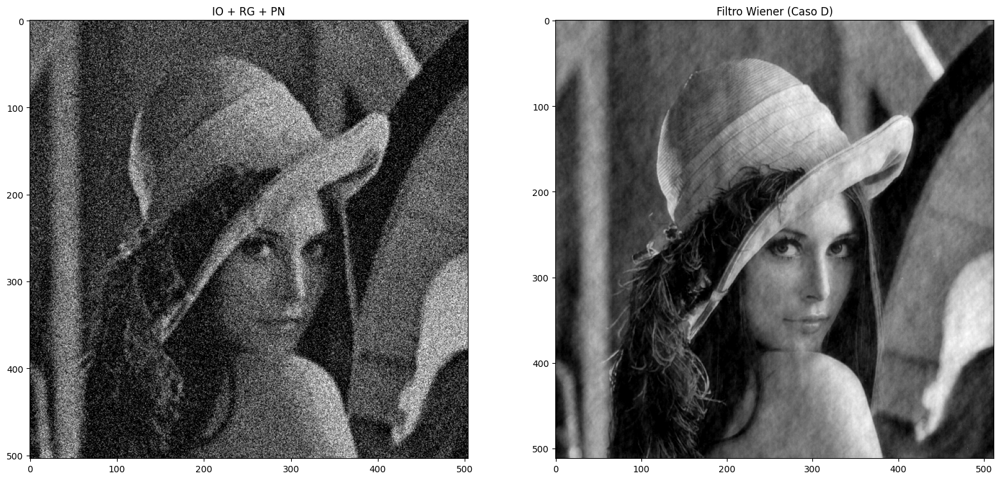

In [49]:
    plt.figure(figsize=(30, 30))

    plt.subplot(1,2,1)
    plt.imshow(img1_G_PN, cmap='gray')
    plt.title('IO + RG + PN')

    plt.subplot(1,2,2)
    plt.imshow(img_Wiener_4, cmap='gray')
    plt.title('Filtro Wiener (Caso D)')

    plt.subplots_adjust(left=0.1, right=0.6, bottom=0.1, top=0.5, wspace=0.2, hspace=0.4)